<a href="https://colab.research.google.com/github/Nmloury/ML-Education/blob/main/projects/fast.ai%20/02_production_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Gradio Pets

In [1]:
!pip install -Uqq fastai fastbook

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 113.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 90.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 99.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
#imports
from fastbook import *
from fastai.vision.widgets import *

In [3]:
results = search_images_ddg('grizzly bear')
ims = results.attrgot('contentUrl')
len(ims)

200

In [4]:
# define dog breeds for classification
dog_breeds = 'pitbull', 'cattle dog', 'golden retriever', 'pug', 'weimaraner'
path = Path('dogs')

In [5]:
# download dog images
if not path.exists():
    path.mkdir()
for o in dog_breeds:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images_ddg(f'{o}')
    download_images(dest, urls=results)

In [6]:
# view image file paths
fns = get_image_files(path)
fns

(#936) [Path('dogs/weimaraner/3bb5f034-8110-4699-9fe3-9bd0f3e401ed.jpg'),Path('dogs/weimaraner/00174a5b-1627-47b8-a5a0-760ecf6f9b20.jpg'),Path('dogs/weimaraner/84686a65-d0ac-4d1e-b016-3c5fa80568a0.jpg'),Path('dogs/weimaraner/ccf7f837-9575-4967-b57c-cbbb5202d1b7.jpg'),Path('dogs/weimaraner/ece3a4d4-33a1-406e-9f1b-859d8ab64413.jpg'),Path('dogs/weimaraner/b528b4d9-b5b3-48e3-84d1-5b02f6e7b0e9.jpg'),Path('dogs/weimaraner/91e08a21-3ad4-432a-aaca-06aa062c1458.jpeg'),Path('dogs/weimaraner/2174d1a9-3562-4a89-92d1-3e8645ac2fc6.jpg'),Path('dogs/weimaraner/9dc31e20-b61d-41d3-934f-92f2551e8d95.jpg'),Path('dogs/weimaraner/5acbc693-4b58-452f-a60b-c57528032f0c.jpg'),Path('dogs/weimaraner/cedbfe4e-2c4e-43ce-9103-a067132cc6f4.jpg'),Path('dogs/weimaraner/2a554ca9-8373-4746-bd9b-fa143f3c72ce.jpeg'),Path('dogs/weimaraner/4a8a67d1-4082-40e9-881b-81fad125d06e.jpg'),Path('dogs/weimaraner/4c9e26d1-fc9f-4122-93e2-0e70fce18920.jpg'),Path('dogs/weimaraner/9235a90b-5c59-4693-89f7-13c92648c36d.jpg'),Path('dogs/weim

In [7]:
# view failed image files
failed = verify_images(fns)
failed

(#9) [Path('dogs/cattle dog/2487478c-c682-485a-99f7-55fe3c072ae5.jpg'),Path('dogs/cattle dog/67251aa8-b3ee-4866-8c36-22b37331b25a.jpg'),Path('dogs/cattle dog/8f426794-eecc-4fda-95f8-0f3a685eb6a8.jpg'),Path('dogs/pug/41e482a5-e3db-4653-a645-cf30d2d5fb04.jpg'),Path('dogs/pitbull/1c75d114-3ec9-4152-9334-a28dfc8a3aad.jpg'),Path('dogs/pitbull/d18f6cd4-c2b5-4a41-a418-12163a0914c6.jpg'),Path('dogs/pitbull/740f087f-4dea-466a-a926-67120dfff494.jpg'),Path('dogs/golden retriever/58b26174-11d6-4b1a-a600-e4d89907926b.jpg'),Path('dogs/golden retriever/5554ea68-b916-40bc-b13f-f039ec16d5fb.jpg')]

In [8]:
#remove failed images
failed.map(Path.unlink);

In [9]:
##
dogs = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [10]:
dls = dogs.dataloaders(path)

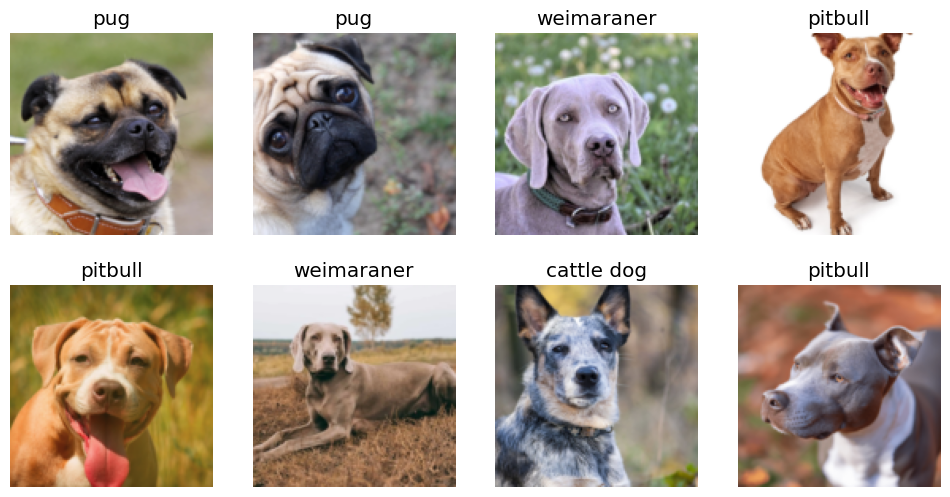

In [11]:
# Let's look at a few images
dls.valid.show_batch(max_n=8, nrows=2)

In [21]:
# Optionally add in some cropping and augmentation to our dataset
dogs = dogs.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = dogs.dataloaders(path)

In [22]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.619622,0.039588,0.016216,00:30


epoch,train_loss,valid_loss,error_rate,time
0,0.150893,0.033744,0.010811,00:30
1,0.109202,0.014174,0.005405,00:30
2,0.080196,0.013717,0.005405,00:30
3,0.064886,0.013120,0.005405,00:29


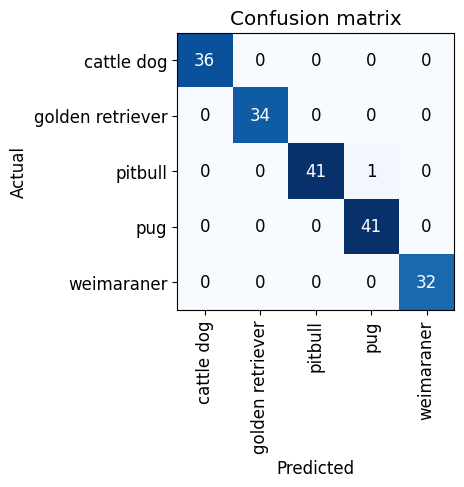

In [23]:
# Create confusion matrix to see where the model is making the most mistakes
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

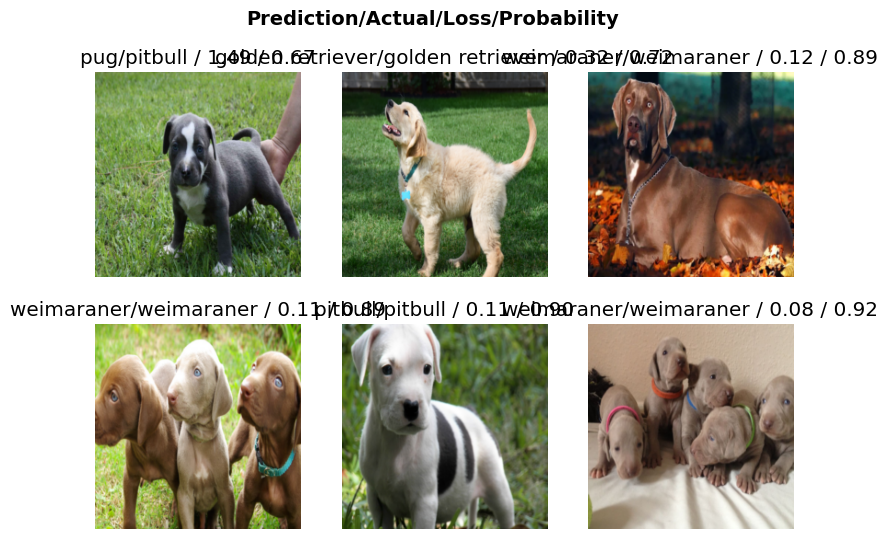

In [24]:
interp.plot_top_losses(6, nrows=2)

In [20]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner